In [ ]:
#честно говоря, это были попытки починить - так заработало
!pip install OSMPythonTools
!pip install -U setuptools
!apt install libspatialindex-c4v5
!pip install rtree
!pip install pipwin
!pip install --upgrade pip
!pip install git+git://github.com/geopandas/geopandas.git
!apt install libspatialindex-c4v5
!pip install pysal

!pip install git+git://github.com/geopandas/geopandas.git
!pip3 install overpy

     |████████████████████████████████| 184kB 13.4MB/s 
  Created wheel for OSMPythonTools: filename=OSMPythonTools-0.2.9-cp36-none-any.whl size=12771 sha256=a4521f6978c18bb897da816179f1d8f298260e41f7c1be7f7dfc47acbfcad70e
  Stored in directory: /root/.cache/pip/wheels/4e/65/34/afe0b46e3dbb1b3da010967781d4999084bfe5c63d7b2eeefd
  Created wheel for pytest-sugar: filename=pytest_sugar-0.9.4-py2.py3-none-any.whl size=8971 sha256=0a9a430afa5b7179562ab1c888a5c9425412c8f72253b93a790e8bc346950087
  Stored in directory: /root/.cache/pip/wheels/72/ac/7f/55050ee786fa4a2bb2d05dea0696eab826ff1d5b8a7dbd5883
Successfully built OSMPythonTools pytest-sugar
     |████████████████████████████████| 2.0MB 13.3MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: setuptools 50.3.2
    Uninstalling setuptools-50.3.2:
      Successfully uninstalled setuptools-50.3.2


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  libspatialindex4v5
The following NEW packages will be installed:
  libspatialindex-c4v5 libspatialindex4v5
0 upgraded, 2 newly installed, 0 to remove and 14 not upgraded.
Need to get 270 kB of archives.
After this operation, 1,107 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex4v5 amd64 1.8.5-5 [219 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libspatialindex-c4v5 amd64 1.8.5-5 [51.7 kB]
Fetched 270 kB in 0s (2,627 kB/s)
Selecting previously unselected package libspatialindex4v5:amd64.
(Reading database ... 144865 files and directories currently installed.)
Preparing to unpack .../libspatialindex4v5_1.8.5-5_amd64.deb ...
Unpacking libspatialindex4v5:amd64 (1.8.5-5) ...
Selecting previously unselected package libspatialindex-c4v5:amd64.
Preparing to

  Cloning git://github.com/geopandas/geopandas.git to /tmp/pip-req-build-rxf_1e0w
     |████████████████████████████████| 41 kB 310 kB/s 
  Created wheel for overpy: filename=overpy-0.4-py3-none-any.whl size=45771 sha256=2741ba8a15f513ee0b8716dd93cab8b0cce59837e79ba594724a1bffe8cd52f0
  Stored in directory: /root/.cache/pip/wheels/be/26/99/bcaf5f060042530729608b5714e962d6b245f83cd986ed127b
Successfully built overpy


### Задача:

Прогноз продаж одной из популярных моделей [фичерфонов](https://ru.wikipedia.org/wiki/%D0%A4%D0%B8%D1%87%D0%B5%D1%80%D1%84%D0%BE%D0%BD) (на картинке ниже пример похожего устройства) в салонах МегаФона
![](https://39.img.avito.st/640x480/8468720439.jpg)

### Исходные данные:

Датасет содержит следующие поля:

1. `point_id` - Индентификатор салона
2. `lon` - Долгота точки
3. `lat` - Широта точки
4. `target` - Значение таргета, усредненное за несколько месяцев и отнормированное

### Требования к решению и советы:

Ниже приведен список из нескольких важных пунктов, необходимых для решения задания. Выполнение каждого из пунктов влияет на итоговую оценку. Вы можете выполнить каждый из пунктов разными способами, самым лучшим будет считаться вариант, когда всё получение и обработка данных будут реализованы на Питоне (пример: вы можете скачать данные из OSM через интерфейс на сайте overpass-turbo или с помощью библиотек `overpass`/`requests`. Оба варианта будут зачтены, но больше баллов можно заработать во втором случае)



1. Салоны расположены в нескольких разных городах, вам необходимо **определить город для каждого салона** (это понадобится во многих частях задания). К этому есть разные подходы. Вы можете провести [обратное геокодирование](https://en.wikipedia.org/wiki/Reverse_geocoding) с помощью геокодера [Nominatim](https://nominatim.org/), доступного через библиотеку `geopy` примерно вот так:
```python
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="specify_your_app_name_here")
location = geolocator.reverse("52.509669, 13.376294")
print(location.address)
```
В таком случае, вам придется обрабатывать полученную строку адреса, чтобы извлечь название города. Также вы можете скачать из OSM или найти в любом другом источнике границы административно территориальных границ России и пересечь с ними датасет с помощью `geopandas.sjoin` (этот вариант более надежный, но нужно будет разобраться с тем, как устроены границы АТД в OSM, обратите внимание на [этот тег](https://wiki.openstreetmap.org/wiki/Key:admin_level))


2. **Используйте данные OSM**: подумайте, какие объекты могут влиять на продажи фичерфонов. Гипотеза: такие телефоны покупают люди, приезжающие в город или страну ненадолго, чтобы вставить туда отдельную симкарту для роуминга. Можно попробовать использовать местоположения железнодорожных вокзалов (изучите [этот тег](https://wiki.openstreetmap.org/wiki/Tag:railway%3Dstation)). Необходимо использовать хотя бы 5 разных типов объектов из OSM. Скорее всего, вам придется качать данные OSM отдельно для разных городов (см. пример для Нью-Йорка из лекции)


3. **Используйте разные способы генерации признаков**: описать положение салона МегаФона относительно станций метро можно разными способами - найти ***расстояние до ближайшей станции***, или же посчитать, сколько станций попадает в ***500 метровую буферную зону*** вокруг салона. Такие признаки будут нести разную информацию. Так же попробуйте поэкспериментировать с размерами буферных зон (представьте, что значат в реальности радиусы 100, 500, 1000 метров). Попробуйте посчитать расстояние до центра города, до других объектов.

4. **Сделайте визуализации**: постройте 2-3 карты для какого нибудь из городов - как распределен в пространстве таргет, где находятся объекты, полученные вами из OSM. Можете использовать любой инструмент - обычный `plot()`, `folium`, `keplergl`. Если выберете Кеплер, обязательно сохраните в файл конфиг карты, чтобы ее можно было воспроизвести. Сделать это можно вот так:

```python
import json
json_data = kepler_map.config
with open('kepler_config.json', 'w') as outfile:
    json.dump(json_data, outfile)
```
5. Задание не ограничено приведенными выше пунктами, попробуйте нагенерировать интересных признаков, найти в интернете дополнительные данные (в таком случае в комментарии к коду укажите ссылку на ресурс, откуда взяли данные)



6. Это довольно сложная задача - датасет очень маленький, данные по своей природе довольно случайны. Поэтому место и скор на Kaggle не будут играть решающую роль в оценке, но позволят заработать дополнительные баллы

### Read data

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import geopandas as gpd
import pandas as pd
import numpy as np
import geojson
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

In [ ]:
#выгружаем данным (нас интересуют все города, то есть и большие, и маленькие, поэтому city и town)
from OSMPythonTools.nominatim import Nominatim
from OSMPythonTools.overpass import overpassQueryBuilder, Overpass

nominatim = Nominatim()
areaId = nominatim.query('Russia').areaId()
overpass = Overpass()
query = overpassQueryBuilder(area=areaId, elementType=['rel'], selector='"place"~"city|town"', out='body geom;out skel qt',includeGeometry=True)
result = overpass.query(query,timeout=600)

[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3600060189)->.searchArea;(rel["place"~"city|town"](area.searchArea);); out body geom;out skel qt geom;


In [ ]:
#"вытаскиваем" координаты из result
from shapely.geometry import Polygon
from shapely.geometry.multipolygon import MultiPolygon

result_dict = {}
mas = []
cnt = 0
for i in result.elements():
  data = {}
  try:
    data['name'] = i.tag('name')
    data['region'] = i.tag('addr:region')   
  except Exception as e:
    pass  
  mass_polygon = []  
  try:
    for j in range(0,len(i.geometry()['coordinates'])):
      if len(i.geometry()['coordinates'][j])==1:
        for k in range(0,len(i.geometry()['coordinates'][j])):
          polygon = (Polygon(i.geometry()['coordinates'][j][k]))
      else:
          try:
            for k in range(0,len(i.geometry()['coordinates'][j])):
              polygon = (Polygon(i.geometry()['coordinates'][j][k]))
          except Exception as e:
            polygon = (Polygon(i.geometry()['coordinates'][j]))
      mass_polygon.append(polygon)
    data['geometry'] = MultiPolygon(mass_polygon)
    mas.append(data)
  except Exception as e:
    pass
result_dict ["results"] = mas
gdf_polygons = gpd.GeoDataFrame(result_dict['results'])

In [ ]:
#геодатафрейм из всех городов и удаляем строки, где город - пустое значение
gdf_polygons = gdf_polygons.dropna(subset=['name'])
gdf_polygons.head()

,name,region,geometry
0,Бологое,Тверская область,"MULTIPOLYGON (((34.06977 57.79634, 34.06127 57..."
1,Лобня,Московская область,"MULTIPOLYGON (((37.50962 56.05379, 37.50967 56..."
2,Электросталь,Московская область,"MULTIPOLYGON (((38.44455 55.75275, 38.44388 55..."
3,Щербинка,Москва,"MULTIPOLYGON (((37.53703 55.49908, 37.53669 55..."
4,Долгопрудный,Московская область,"MULTIPOLYGON (((37.51261 55.98826, 37.51212 55..."


In [ ]:
from google.colab import drive

drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [ ]:
train = pd.read_csv('/content/gdrive/MyDrive/mf_geo_train.csv')
test = pd.read_csv('/content/gdrive/MyDrive/mf_geo_test.csv')

In [ ]:
#переводим в геопандас
gdf = gpd.GeoDataFrame(train, geometry=gpd.points_from_xy(train.lon, train.lat))
gdf_test = gpd.GeoDataFrame(test, geometry=gpd.points_from_xy(test.lon, test.lat))

In [ ]:
test.shape

(107, 5)

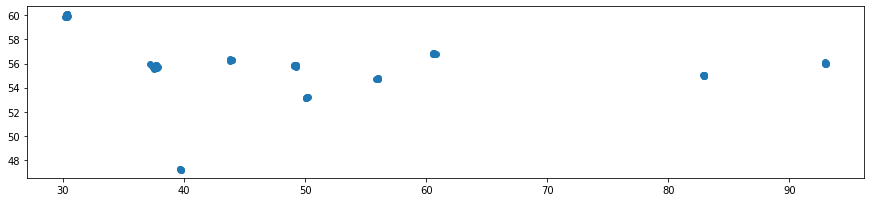

In [ ]:
gdf_test.plot(figsize=(15,10))

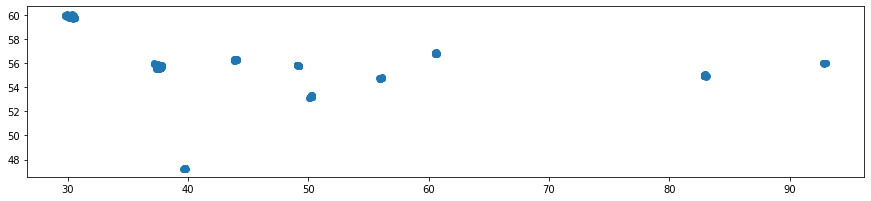

In [ ]:
gdf.plot(figsize=(15,10))

In [ ]:
intersect = gpd.sjoin(gdf,gdf_polygons[['name','geometry']], op='within')
intersect = intersect.drop(['index_right'], axis = 1)
intersect.shape


(414, 6)

In [ ]:
intersect_test = gpd.sjoin(gdf_test,gdf_polygons[['name','geometry']], op='within')
intersect_test = intersect_test.drop(['index_right'], axis = 1)
intersect_test.shape


(106, 6)

In [ ]:
#можем заметить, что часть точек не попадает в эти полигоны, это связано с тем, что мы выгрузили city и town
#а москва здесь не включает в себя такие города как Щербинка, Троицк и тд, которые по сути, входят в пределы москвы
#поэтому, если точка находится в "деревне", входящей в пределы москвы, то она выпадает из нашего списка
#как вариант - включить эти точки в ближайший город
import folium

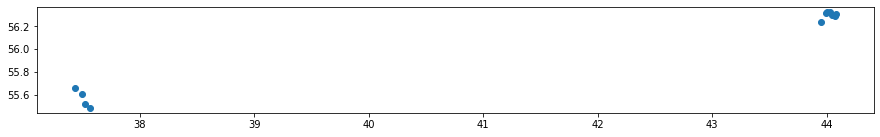

In [ ]:
#выпавшие точки
dif = pd.concat([intersect[['point_id', 'lon'	,'lat','target','geometry']], gdf[['point_id', 'lon'	,'lat','target','geometry']]]).drop_duplicates(keep=False)
dif.plot(figsize=(15,10))

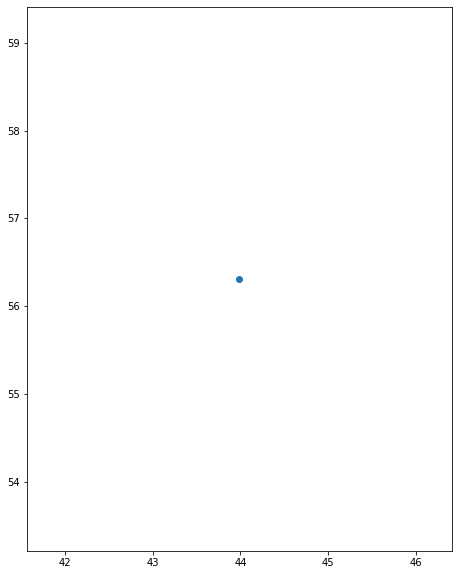

In [ ]:
dif_test = pd.concat([intersect_test[['point_id', 'lon'	,'lat','target','geometry']], gdf_test[['point_id', 'lon'	,'lat','target','geometry']]]).drop_duplicates(keep=False)
dif_test.plot(figsize=(15,10))

In [ ]:
points = gdf.to_json()
poly = gdf_polygons.to_json()

In [ ]:
gdf_polygons_short=gdf_polygons[gdf_polygons['name'].isin(intersect['name'])].reset_index()

In [ ]:
#визуализируем полигоны и салоны (если увеличить, можно заметить эти точки, которые выпали)
#в частности - под Москвой где деревня Язово, но таких несколько (425 минус 414)
m = folium.Map([50, 55], zoom_start=4) 
folium.GeoJson(points).add_to(m)
folium.GeoJson(poly).add_to(m)
m

In [ ]:
#здесь для тех точек, которые "выпали" из нашей таблицы, записываем ближайший город
from shapely.geometry import Point, Polygon
import random
from operator import itemgetter

dif['name']=np.zeros(dif.shape[0])
dif = dif.reset_index()
cnt = 0
for j in dif['geometry']:
  min = gdf_polygons_short['geometry'][0][0]
  index_min = 0
  for i in range(len(gdf_polygons_short['geometry'])):
    for poly in gdf_polygons_short['geometry'][i]:
      if poly.distance(j) < min.distance(j):
        min=poly
        index_min = i
  dif['name'][cnt]= gdf_polygons_short['name'][index_min]
  cnt+=1

In [ ]:
dif_test['name']=np.zeros(dif_test.shape[0])
dif_test = dif_test.reset_index()
cnt = 0
for j in dif_test['geometry']:
  min = gdf_polygons_short['geometry'][0][0]
  index_min = 0
  for i in range(len(gdf_polygons_short['geometry'])):
    for poly in gdf_polygons_short['geometry'][i]:
      if poly.distance(j) < min.distance(j):
        min=poly
        index_min = i
  dif_test['name'][cnt]= gdf_polygons_short['name'][index_min]
  cnt+=1

In [ ]:
#теперь у нас все 425 точек для трейна
new_data = pd.concat([dif,intersect])
new_data = new_data.drop(['index'],axis = 1).reset_index()
new_data.shape

(425, 7)

In [ ]:
#теперь у нас все 107 точек для теста
new_data_test = pd.concat([dif_test,intersect_test])
new_data_test = new_data_test.drop(['index'],axis = 1).reset_index()
new_data_test.shape

(107, 7)

In [ ]:
#очевидно, что многие города, входящие в состав москвы и питера по некоторым признакам схожи с крупными, по некоторым - нет
#поэтому напишем также big_city
new_data['big_city']=np.zeros(new_data.shape[0])
for i in range(len(new_data['name'])):
  if new_data['name'][i] == "Троицк" or new_data['name'][i] == "Зеленоград" or new_data['name'][i]=="Щербинка":
    new_data["big_city"][i] = "Москва"
  elif new_data['name'][i]=="Колпино" or new_data['name'][i]=="Кронштадт" or new_data['name'][i]=="Красное Село" or new_data['name'][i]=="Сестрорецк" or new_data['name'][i]=="Петергоф" or new_data['name'][i] =="Ломоносов" or new_data['name'][i]=="Пушкин":
    new_data["big_city"][i] = 'Санкт-Петербург'
  else:
    new_data["big_city"][i] = new_data['name'][i]
new_data.head()

,index,point_id,lon,lat,target,geometry,name,distance_centre,big_city
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.0,Нижний Новгород
1,1,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,0.0,Москва
2,2,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,0.0,Нижний Новгород
3,3,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,0.0,Нижний Новгород
4,4,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,0.0,Нижний Новгород


In [ ]:
new_data_test['big_city']=np.zeros(new_data_test.shape[0])
for i in range(len(new_data_test['name'])):
  if new_data_test['name'][i] == "Троицк" or new_data_test['name'][i] == "Зеленоград" or new_data_test['name'][i]=="Щербинка":
    new_data_test["big_city"][i] = "Москва"
  elif new_data_test['name'][i]=="Колпино" or new_data_test['name'][i]=="Парголово" or new_data_test['name'][i]=="Кронштадт" or new_data_test['name'][i]=="Красное Село" or new_data_test['name'][i]=="Сестрорецк" or new_data_test['name'][i]=="Петергоф" or new_data_test['name'][i] =="Ломоносов" or new_data_test['name'][i]=="Пушкин":
    new_data_test["big_city"][i] = 'Санкт-Петербург'
  else:
    new_data_test["big_city"][i] = new_data_test['name'][i]
new_data_test.head()

,index,point_id,lon,lat,target,geometry,name,big_city
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород
1,0,F4lXR1cG,37.681242,55.748040,0.0091,POINT (37.68124 55.74804),Москва,Москва
2,2,kLuAAN3s,37.598614,55.781357,0.0091,POINT (37.59861 55.78136),Москва,Москва
3,3,OxQHvaNu,37.794051,55.717468,0.0091,POINT (37.79405 55.71747),Москва,Москва
4,5,7x7uZwPc,37.617141,55.795433,0.0091,POINT (37.61714 55.79543),Москва,Москва


In [ ]:
#определим расстояние до центра города
#предположу, что для точек, находящихся в таких городах, как Щербинка, будем считать до центра Москвы 
query = overpassQueryBuilder(area=areaId, elementType=['node'], selector='"place"~"city|town"', out='body geom;out skel qt',includeGeometry=True)
result_cities = overpass.query(query,timeout=600)

[overpass] downloading data: [timeout:600][out:json];area(3600060189)->.searchArea;(node["place"~"city|town"](area.searchArea);); out body geom;out skel qt geom;


In [ ]:
#дистанция до центра города
from geopy import distance
new_data['distance_centre']=np.zeros(new_data.shape[0])
for i in range(len(new_data['point_id'])):
  point_true = (new_data['geometry'][i].y,new_data['geometry'][i].x)
  for j in result_cities.elements():
    try:
      name = j.tag('name')
    except Exception as e:
      name = ""
    if new_data['big_city'][i] == name:
      x = j.lat()
      y = j.lon()
      point = (x,y)
      distance_new_data =  distance.distance(point_true,point).km
      index = new_data[new_data['point_id']==new_data['point_id'][i]].index.values.astype(int)[0]
      new_data['distance_centre'][index] = distance_new_data

In [ ]:
new_data = new_data.drop(['index'],axis = 1).reset_index()
new_data.head()

,index,point_id,lon,lat,target,geometry,name,distance_centre,big_city
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород
1,1,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,25.934779,Москва
2,2,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород
3,3,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород
4,4,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород


In [ ]:
new_data_test['distance_centre']=np.zeros(new_data_test.shape[0])
for i in range(len(new_data_test['point_id'])):
  point_true = (new_data_test['geometry'][i].y,new_data_test['geometry'][i].x)
  for j in result_cities.elements():
    try:
      name = j.tag('name')
    except Exception as e:
      name = ""
    if new_data_test['big_city'][i] == name:
      x = j.lat()
      y = j.lon()
      point = (x,y)
      distance_new_data =  distance.distance(point_true,point).km
      index = new_data_test[new_data_test['point_id']==new_data_test['point_id'][i]].index.values.astype(int)[0]
      new_data_test['distance_centre'][index] = distance_new_data

In [ ]:
new_data_test = new_data_test.drop(['index'],axis = 1).reset_index()
new_data_test.head()

,index,point_id,lon,lat,target,geometry,name,big_city,distance_centre
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167
1,1,F4lXR1cG,37.681242,55.748040,0.0091,POINT (37.68124 55.74804),Москва,Москва,4.012063
2,2,kLuAAN3s,37.598614,55.781357,0.0091,POINT (37.59861 55.78136),Москва,Москва,3.639877
3,3,OxQHvaNu,37.794051,55.717468,0.0091,POINT (37.79405 55.71747),Москва,Москва,11.683349
4,4,7x7uZwPc,37.617141,55.795433,0.0091,POINT (37.61714 55.79543),Москва,Москва,5.008787


In [ ]:
#предположу, что можно в качестве признаков можно использовать статистику по регионам, поэтому определим регион нашим городам - пересечем с admin_level_4
#АТД 4 левел - регионы 
adm = gpd.read_file('/content/gdrive/MyDrive/admin_level_4.geojson')
adm.head()

,name,name:ru,boundary,admin_level,ref,int_ref,name:ca,name:de,name:en,name:es,name:fr,name:hu,name:ja,name:lt,name:nl,name:pl,name:pt,name:sv,name:uk,name:vi,name:zh,alt_name,int_name,timezone,ISO3166-2,wikipedia,population,addr:country,is_in:country,gost_7.67-2003,is_in:continent,official_status,population:date,is_in:country_code,ref:en,name:fi,name:hr,name:no,name:sk,name:sr,...,name:ast,name:tzl,old_name,old_name:en,old_name:eo,old_name:fr,old_name:os,old_name:vi,addr:postcode,old_alt_name:vi,name:koi,name:lbe,name:lez,name:az-cyr,official_name:az,official_name:ce,official_name:es,official_name:fr,official_name:it,official_name:lez,name:ky,ssrf:code,cadaster:code,omkte:code,addr:region,alt_name:ru,name:atv,alt_name:ca,alt_name:en,alt_name:fr,alt_name:nl,name:sq,name:su,name:ug,name:tyv,official_name:bxr,name:aba,name:nog,alt_name:sl,geometry
0,Сумска,Сумска,administrative,4,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((35.39847 50.90907, 35.39812 50..."
1,Камчатский край,Камчатский край,administrative,4,RU-KAM,RU-KAM,Territori de Kamtxatka,Region Kamtschatka,Kamchatka Krai,Krai de Kamchatka,Kraï du Kamtchatka,Kamcsatkai határterület,カムチャツカ地方,Kamčiatkos kraštas,Kraj Kamtsjatka,Kraj Kamczacki,Krai de Kamtchatka,Kamtjatka kraj,Камчатський край,Kamchatka (vùng),堪察加邊疆區,Камчатка,Kamchatkiy Kray,Asia/Kamchatka,RU-KAM,ru:Камчатский край,319864,RU,Russia,РОФ-КАМ,Asia,ru:край,2014-01-01,RU,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((168.44560 54.51135, 168.44581 ..."
2,Мурманская область,Мурманская область,administrative,4,RU-MUR,RU-MUR,Província de Múrmansk,Oblast Murmansk,Murmansk Oblast,Óblast de Múrmansk,Oblast de Mourmansk,None,None,Murmansko sritis,None,Obwód murmański,None,Murmansk oblast,None,None,None,None,Murmansk Oblast,Europe/Moscow,RU-MUR,ru:Мурманская область,780401,RU,None,РОФ-МУР,None,None,2013-01-01,None,MUR,Murmanskin alue,Murmanska oblast,Murmansk oblast,Murmanská oblasť,Мурманска област,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((42.50570 66.99024, 42.31571 66..."
3,Пермский край,Пермский край,administrative,4,RU-PER,RU-PER,Territori de Perm,Region Perm,Perm Krai,None,None,None,None,Permės kraštas,None,Kraj Permski,None,None,None,None,None,None,None,Asia/Yekaterinburg,RU-PER,ru:Пермский край,2637032,RU,None,РОФ-ПЕР,None,None,2015,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((59.48273 60.82788, 59.47942 60..."
4,Свердловская область,Свердловская область,administrative,4,RU-SVE,RU-SVE,Província de Sverdlovsk,Oblast Swerdlowsk,Sverdlovsk Oblast,None,Oblast de Sverdlovsk,None,None,Sverdlovsko sritis,None,Obwód swierdłowski,None,None,None,None,None,None,None,Asia/Yekaterinburg,RU-SVE,ru:Свердловская_область,None,RU,None,РОФ-СВЕ,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((66.18486 58.01097, 66.15487 58..."


In [ ]:
tuts_tuts = gpd.sjoin(new_data,adm[['name','geometry']], op='within')
tuts_tuts = tuts_tuts.drop(['index_right','index'],axis = 1)
tuts_tuts = tuts_tuts.rename(columns={"name_left": "city", "name_right": "region"}).reset_index()
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область
1,2,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область
2,3,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область
3,4,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область
4,6,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область


In [ ]:
tuts_tuts_test = gpd.sjoin(new_data_test,adm[['name','geometry']], op='within')
tuts_tuts_test = tuts_tuts_test.drop(['index_right','index'],axis = 1)
tuts_tuts_test = tuts_tuts_test.rename(columns={"name_left": "city", "name_right": "region"}).reset_index()
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область
1,86,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область
2,87,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область
3,88,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область
4,89,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область


In [ ]:
tuts_tuts['big_city'].unique()

array(['Нижний Новгород', 'Москва', 'Ростов-на-Дону', 'Красноярск',
       'Санкт-Петербург', 'Уфа', 'Казань', 'Екатеринбург', 'Новосибирск',
       'Самара'], dtype=object)

In [ ]:
tuts_tuts_test['big_city'].unique()

array(['Нижний Новгород', 'Москва', 'Екатеринбург', 'Казань',
       'Санкт-Петербург', 'Самара', 'Новосибирск', 'Ростов-на-Дону',
       'Уфа', 'Красноярск'], dtype=object)

In [ ]:
# В интернете найдены статистики по регионам и по районам Москвы, также собрала некоторую информацию по "big_city"
# поэтому создам две колонки для дальнейшего построения признаков - Районы Москвы + регионы и Районы Москвы + города
# поскольку город большой и районы очень разношерстные по различным храктеристикам

In [ ]:
#отдельный датасет с городами москвы, чтоб разбить по 8 левелу
moscow = tuts_tuts[tuts_tuts['big_city']=='Москва']
moscow.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region
21,1,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,25.934779,Москва,Москва
22,5,GSLqcJM1,37.429700,55.658750,0.818785,POINT (37.42970 55.65875),Москва,15.608096,Москва,Москва
23,9,YhUH0AzP,37.564275,55.485306,-0.996459,POINT (37.56428 55.48531),Щербинка,29.709173,Москва,Москва
24,10,fPqxIVRl,37.492471,55.603912,0.127264,POINT (37.49247 55.60391),Москва,18.111552,Москва,Москва
25,11,ommNZCUV,37.590776,55.848630,-0.348157,POINT (37.59078 55.84863),Москва,11.059296,Москва,Москва


In [ ]:
moscow_test = tuts_tuts_test[tuts_tuts_test['big_city']=='Москва']
moscow_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region
5,1,F4lXR1cG,37.681242,55.748040,0.0091,POINT (37.68124 55.74804),Москва,Москва,4.012063,Москва
6,2,kLuAAN3s,37.598614,55.781357,0.0091,POINT (37.59861 55.78136),Москва,Москва,3.639877,Москва
7,3,OxQHvaNu,37.794051,55.717468,0.0091,POINT (37.79405 55.71747),Москва,Москва,11.683349,Москва
8,4,7x7uZwPc,37.617141,55.795433,0.0091,POINT (37.61714 55.79543),Москва,Москва,5.008787,Москва
9,5,OMCMewkC,37.798028,55.810580,0.0091,POINT (37.79803 55.81058),Москва,Москва,13.158389,Москва


In [ ]:
#АТД 8 левел - районы москвы
#данные скачаны с https://mydata.biz/ru/catalog/databases/borders_ru для различных уровней
adm8 = gpd.read_file('/content/gdrive/MyDrive/admin_level_8.geojson')

In [ ]:
intersect_mos = gpd.sjoin(moscow,adm8[['name','geometry']], op='within')
intersect_mos = intersect_mos.drop(['index_right'], axis = 1)
intersect_mos.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,name
21,1,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,25.934779,Москва,Москва,поселение Воскресенское
22,5,GSLqcJM1,37.429700,55.658750,0.818785,POINT (37.42970 55.65875),Москва,15.608096,Москва,Москва,поселение Московский
23,9,YhUH0AzP,37.564275,55.485306,-0.996459,POINT (37.56428 55.48531),Щербинка,29.709173,Москва,Москва,поселение Рязановское
24,10,fPqxIVRl,37.492471,55.603912,0.127264,POINT (37.49247 55.60391),Москва,18.111552,Москва,Москва,поселение Сосенское
25,11,ommNZCUV,37.590776,55.848630,-0.348157,POINT (37.59078 55.84863),Москва,11.059296,Москва,Москва,район Отрадное


In [ ]:
intersect_mos_test = gpd.sjoin(moscow_test,adm8[['name','geometry']], op='within')
intersect_mos_test = intersect_mos_test.drop(['index_right'], axis = 1)
intersect_mos_test = intersect_mos_test.rename(columns={"name": "adm_for_feature"}).reset_index()
intersect_mos_test.head()

,level_0,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature
0,5,1,F4lXR1cG,37.681242,55.748040,0.0091,POINT (37.68124 55.74804),Москва,Москва,4.012063,Москва,Таганский район
1,6,2,kLuAAN3s,37.598614,55.781357,0.0091,POINT (37.59861 55.78136),Москва,Москва,3.639877,Москва,Тверской район
2,33,29,LbLThb6j,37.620124,55.771685,0.0091,POINT (37.62012 55.77168),Москва,Москва,2.370441,Москва,Тверской район
3,7,3,OxQHvaNu,37.794051,55.717468,0.0091,POINT (37.79405 55.71747),Москва,Москва,11.683349,Москва,Рязанский район
4,16,12,kDCyn0Ha,37.792218,55.716685,0.0091,POINT (37.79222 55.71668),Москва,Москва,11.602143,Москва,Рязанский район


In [ ]:
intersect_mos = intersect_mos.rename(columns={"name": "adm_for_feature"}).reset_index()
intersect_mos.head()

,level_0,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature
0,21,1,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,25.934779,Москва,Москва,поселение Воскресенское
1,22,5,GSLqcJM1,37.429700,55.658750,0.818785,POINT (37.42970 55.65875),Москва,15.608096,Москва,Москва,поселение Московский
2,23,9,YhUH0AzP,37.564275,55.485306,-0.996459,POINT (37.56428 55.48531),Щербинка,29.709173,Москва,Москва,поселение Рязановское
3,24,10,fPqxIVRl,37.492471,55.603912,0.127264,POINT (37.49247 55.60391),Москва,18.111552,Москва,Москва,поселение Сосенское
4,25,11,ommNZCUV,37.590776,55.848630,-0.348157,POINT (37.59078 55.84863),Москва,11.059296,Москва,Москва,район Отрадное


In [ ]:
intersect_mos = intersect_mos.drop(['level_0', 'index'], axis = 1)
intersect_mos['adm_for_feature_reg'] = intersect_mos['adm_for_feature'].values
intersect_mos.head()

,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg
0,5jpPGoo6,37.517761,55.524437,-0.585868,POINT (37.51776 55.52444),Москва,25.934779,Москва,Москва,поселение Воскресенское,поселение Воскресенское
1,GSLqcJM1,37.429700,55.658750,0.818785,POINT (37.42970 55.65875),Москва,15.608096,Москва,Москва,поселение Московский,поселение Московский
2,YhUH0AzP,37.564275,55.485306,-0.996459,POINT (37.56428 55.48531),Щербинка,29.709173,Москва,Москва,поселение Рязановское,поселение Рязановское
3,fPqxIVRl,37.492471,55.603912,0.127264,POINT (37.49247 55.60391),Москва,18.111552,Москва,Москва,поселение Сосенское,поселение Сосенское
4,ommNZCUV,37.590776,55.848630,-0.348157,POINT (37.59078 55.84863),Москва,11.059296,Москва,Москва,район Отрадное,район Отрадное


In [ ]:
intersect_mos_test = intersect_mos_test.drop(['level_0', 'index'], axis = 1)
intersect_mos_test['adm_for_feature_reg'] = intersect_mos_test['adm_for_feature'].values
intersect_mos_test.head()

,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg
0,F4lXR1cG,37.681242,55.748040,0.0091,POINT (37.68124 55.74804),Москва,Москва,4.012063,Москва,Таганский район,Таганский район
1,kLuAAN3s,37.598614,55.781357,0.0091,POINT (37.59861 55.78136),Москва,Москва,3.639877,Москва,Тверской район,Тверской район
2,LbLThb6j,37.620124,55.771685,0.0091,POINT (37.62012 55.77168),Москва,Москва,2.370441,Москва,Тверской район,Тверской район
3,OxQHvaNu,37.794051,55.717468,0.0091,POINT (37.79405 55.71747),Москва,Москва,11.683349,Москва,Рязанский район,Рязанский район
4,kDCyn0Ha,37.792218,55.716685,0.0091,POINT (37.79222 55.71668),Москва,Москва,11.602143,Москва,Рязанский район,Рязанский район


In [ ]:
# остальные города
other = pd.concat([intersect_mos[['point_id','geometry']], tuts_tuts[['point_id','geometry']]]).drop_duplicates(keep=False)
other_points = other['point_id'].values

In [ ]:
other_test = pd.concat([intersect_mos_test[['point_id','geometry']], tuts_tuts_test[['point_id','geometry']]]).drop_duplicates(keep=False)
other_points_test = other_test['point_id'].values

In [ ]:
tuts_tuts = tuts_tuts[tuts_tuts['point_id'].isin(other_points)]
tuts_tuts['adm_for_feature'] = tuts_tuts['big_city'].values
tuts_tuts['adm_for_feature_reg'] = tuts_tuts['region'].values
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
1,2,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
2,3,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
3,4,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
4,6,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область


In [ ]:
tuts_tuts_test = tuts_tuts_test[tuts_tuts_test['point_id'].isin(other_points_test)]
tuts_tuts_test['adm_for_feature'] = tuts_tuts_test['big_city'].values
tuts_tuts_test['adm_for_feature_reg'] = tuts_tuts_test['region'].values
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область
1,86,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область
2,87,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область
3,88,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область
4,89,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область


In [ ]:
#соединим два датафрейма
tuts_tuts = pd.concat([tuts_tuts, intersect_mos])
tuts_tuts = tuts_tuts.drop(['index'], axis = 1)
tuts_tuts.head()

,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg
0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область
4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область


In [ ]:
tuts_tuts = tuts_tuts.reset_index()

In [ ]:
tuts_tuts_test = pd.concat([tuts_tuts_test, intersect_mos_test])
tuts_tuts_test = tuts_tuts_test.drop(['index'], axis = 1)
tuts_tuts_test = tuts_tuts_test.reset_index()
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область


In [ ]:
tuts_tuts.shape

(425, 12)

In [ ]:
#рассчитаем расстояние до ближайшего ж/д вокзала
#сложность - тэг берет и станции метро, что больше характеризует общественный транспорт, то есть перемещения по городу, нежели миграционный фактор
#пока наша гипотеза в том, что фичерфонами пользуются в основном приезжие
list_cities = ['Нижний Новгород', 'Москва', 'Ростов-на-Дону', 'Красноярск',
       'Санкт-Петербург', 'Кронштадт', 'Уфа', 'Казань', 'Екатеринбург',
       'Новосибирск', 'Самара']

tuts_tuts['distance_railway']=np.zeros(tuts_tuts.shape[0])

def find_min(mass):
  min = mass[0]
  for i in mass:
    if i < min:
      min = i
  return min
for i in range(len(tuts_tuts['point_id'])):
      point_true = (tuts_tuts['geometry'][i].y,tuts_tuts['geometry'][i].x)
      mass_points =[]
      for ii in list_cities:        
        query = overpassQueryBuilder(area=nominatim.query(ii+',Россия').areaId(), elementType=['node'], selector='"railway"="station"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
            if j.tag('station') == None:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              #print(distance_new_data)
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
      if len(mass_points)>0:
        min_dist = find_min(mass_points)
        index = tuts_tuts[tuts_tuts['point_id']==tuts_tuts['point_id'][i]].index.values.astype(int)[0]
        tuts_tuts['distance_railway'][index] = min_dist

[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["railway"="station"](area.searchArea);); out body geom;out skel qt geom;
[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3602555133)->.searchArea;(node["railway"="station"](area.searchArea);); out body geom;out skel qt geom;
[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3601285772)->.searchArea;(node["railway"="station"](area.searchArea);); out body geom;out skel qt geom;
[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3601430616)->.searchArea;(node["railway"="station"](area.searchArea);); out body geom;out skel qt geom;
[nominatim] downloading data: search
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["railway"="station"](area.searchArea);); out body geom;out skel qt geom;
[nomi

In [ ]:
list_cities = ['Нижний Новгород', 'Москва', 'Ростов-на-Дону', 'Красноярск',
       'Санкт-Петербург', 'Кронштадт', 'Уфа', 'Казань', 'Екатеринбург',
       'Новосибирск', 'Самара']

tuts_tuts_test['distance_railway']=np.zeros(tuts_tuts_test.shape[0])

def find_min(mass):
  min = mass[0]
  for i in mass:
    if i < min:
      min = i
  return min

for i in range(len(tuts_tuts_test['point_id'])):
      point_true = (tuts_tuts_test['geometry'][i].y,tuts_tuts_test['geometry'][i].x)
      mass_points =[]
      for ii in list_cities:        
        query = overpassQueryBuilder(area=nominatim.query(ii+',Россия').areaId(), elementType=['node'], selector='"railway"="station"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
            if j.tag('station') == None:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              #print(distance_new_data)
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
      if len(mass_points)>0:
        min_dist = find_min(mass_points)
        index = tuts_tuts_test[tuts_tuts_test['point_id']==tuts_tuts_test['point_id'][i]].index.values.astype(int)[0]
        tuts_tuts_test['distance_railway'][index] = min_dist

In [ ]:
#визуализация распределения таргета была осуществлена в попытке найти закономерность (можно увеличить и тыкнуть на точку)
#как видно, достаточно случайное распределение, однозначной привязки к каким-то объектам не наблюдается
m = folium.Map([50, 55], zoom_start=4) 
for i in range(len(tuts_tuts['point_id'])):
  folium.Marker([tuts_tuts['geometry'][i].y,tuts_tuts['geometry'][i].x], popup=str(tuts_tuts['target'][i])).add_to(m)
m

In [ ]:
# расстояние до ближайшей гостиницы/отеля/хостела
tuts_tuts['distance_hotel']=np.zeros(tuts_tuts.shape[0])

for i in range(len(tuts_tuts['point_id'])):
      point_true = (tuts_tuts['geometry'][i].y,tuts_tuts['geometry'][i].x)
      mass_points =[]
      for ii in list_cities:        
        query = overpassQueryBuilder(area=nominatim.query(ii+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
      if len(mass_points)>0:
        min_dist = find_min(mass_points)
        index = tuts_tuts[tuts_tuts['point_id']==tuts_tuts['point_id'][i]].index.values.astype(int)[0]
        tuts_tuts['distance_hotel'][index] = min_dist
tuts_tuts.head()        

[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3602555133)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601285772)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601430616)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601185387)->.searchArea;(node["tourism"~"hostel|motel|hostel"](area.sea

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262


In [ ]:
tuts_tuts_test['distance_hotel']=np.zeros(tuts_tuts_test.shape[0])

for i in range(len(tuts_tuts_test['point_id'])):
      point_true = (tuts_tuts_test['geometry'][i].y,tuts_tuts_test['geometry'][i].x)
      mass_points =[]
      for ii in list_cities:        
        query = overpassQueryBuilder(area=nominatim.query(ii+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
      if len(mass_points)>0:
        min_dist = find_min(mass_points)
        index = tuts_tuts_test[tuts_tuts_test['point_id']==tuts_tuts_test['point_id'][i]].index.values.astype(int)[0]
        tuts_tuts_test['distance_hotel'][index] = min_dist
tuts_tuts_test.head() 

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130


In [ ]:
#количество гостиниц в радиусе 1 км
tuts_tuts['counts_hotel_1000']=np.zeros(tuts_tuts.shape[0])
radius = 1 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) 
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]      
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['counts_hotel_1000'][i]=cnt
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0


In [ ]:
tuts_tuts['counts_hotel_500']=np.zeros(tuts_tuts.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) 
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]      
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['counts_hotel_500'][i]=cnt
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0


In [ ]:
tuts_tuts_test['counts_hotel_1000']=np.zeros(tuts_tuts_test.shape[0])
radius = 1 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values())
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]      
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['counts_hotel_1000'][i]=cnt
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0


In [ ]:
tuts_tuts_test['counts_hotel_500']=np.zeros(tuts_tuts_test.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType=['node'], selector='"tourism"~"hostel|motel|hostel"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values())
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]      
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['counts_hotel_500'][i]=cnt
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0


In [ ]:
#посчитаем количество остановок общественного трансорта в радиусе 500 м
#"public_transport"~"platform"
tuts_tuts['public_transport_500']=np.zeros(tuts_tuts.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType='node', selector='"public_transport"~"platform"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  #print(len(result_cities.elements()))
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    #print(test_point_tuple) 
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['public_transport_500'][i]=cnt
tuts_tuts.head()

[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601285772)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601430616)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601549169)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3603437391)->.searchArea;(node["public_transport"~"platform"](area.searchArea);); 

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0


In [ ]:
#"public_transport"~"platform"
tuts_tuts_test['public_transport_500']=np.zeros(tuts_tuts_test.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType='node', selector='"public_transport"~"platform"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['public_transport_500'][i]=cnt
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,30.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,0.0


In [ ]:
#"railway"~"subway_entrance"'
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType='node', selector='"railway"~"subway_entrance"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['public_transport_500'][i]=int(tuts_tuts['public_transport_500'][i])+cnt
tuts_tuts.head()

[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601285772)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601430616)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601549169)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3603437391)->.searchArea;(node["railway"~"subway_entrance"](area.searchArea);); out body geo

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0


In [ ]:
#"railway"~"subway_entrance"'
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType='node', selector='"railway"~"subway_entrance"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['public_transport_500'][i]=int(tuts_tuts_test['public_transport_500'][i])+cnt
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0


In [ ]:
#предположим, что необходимо снять деньги/обменять валюту, поэтому посчитаем количество банков в радиусе 500 м
tuts_tuts['count_banks']=np.zeros(tuts_tuts.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"bank"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['count_banks'][i]=cnt
tuts_tuts

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,156,omENfbNH,37.305857,55.485758,0.862005,POINT (37.30586 55.48576),Троицк,35.411279,Москва,Москва,городской округ Троицк,городской округ Троицк,19.731403,17.898454,0.0,0.0,0.0,0.0
421,157,cI5aMfP5,37.174766,55.981852,-0.067227,POINT (37.17477 55.98185),Зеленоград,37.843304,Москва,Москва,район Силино,район Силино,23.969891,19.802320,0.0,0.0,0.0,0.0
422,158,HWurGKxG,37.174811,55.982678,-0.866799,POINT (37.17481 55.98268),Зеленоград,37.903702,Москва,Москва,район Силино,район Силино,24.034031,19.872995,0.0,0.0,0.0,0.0
423,159,plCkOHbN,37.199926,56.008615,-0.910019,POINT (37.19993 56.00861),Зеленоград,38.848802,Москва,Москва,район Матушкино,район Матушкино,24.103337,21.398438,0.0,0.0,0.0,0.0


In [ ]:
tuts_tuts_test['count_banks']=np.zeros(tuts_tuts_test.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"bank"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['count_banks'][i]=cnt
tuts_tuts_test

[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3606564910)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3603437391)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3603368701)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600366544)->.searchArea;(node["amenity"~"bank"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,35,21sDnd2f,37.665634,55.779620,0.0091,POINT (37.66563 55.77962),Москва,Москва,4.436390,Москва,Красносельский район,Красносельский район,0.572951,0.110989,22.0,10.0,32.0,12.0
103,36,OvdClpSy,37.655172,55.776347,0.0091,POINT (37.65517 55.77635),Москва,Москва,3.729603,Москва,Красносельский район,Красносельский район,0.249812,0.561172,26.0,0.0,52.0,14.0
104,37,f91ZeyYl,37.756084,55.659195,0.0091,POINT (37.75608 55.65919),Москва,Москва,13.383924,Москва,район Марьино,район Марьино,3.595265,2.074408,0.0,0.0,40.0,10.0
105,38,BEh6jJ04,37.565332,55.723456,0.0091,POINT (37.56533 55.72346),Москва,Москва,4.445926,Москва,район Хамовники,район Хамовники,2.070914,0.263682,2.0,2.0,16.0,10.0


In [ ]:
# расстояние до ближайшего банка
tuts_tuts['distance_bank']=np.zeros(tuts_tuts.shape[0])

for i in range(len(tuts_tuts['point_id'])):
        point_true = (tuts_tuts['geometry'][i].y,tuts_tuts['geometry'][i].x)
        mass_points =[]      
        query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"bank"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
        if len(mass_points)>0:
          min_dist = find_min(mass_points)
          index = tuts_tuts[tuts_tuts['point_id']==tuts_tuts['point_id'][i]].index.values.astype(int)[0]
          tuts_tuts['distance_bank'][index] = min_dist

tuts_tuts

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,156,omENfbNH,37.305857,55.485758,0.862005,POINT (37.30586 55.48576),Троицк,35.411279,Москва,Москва,городской округ Троицк,городской округ Троицк,19.731403,17.898454,0.0,0.0,0.0,0.0,14.654421
421,157,cI5aMfP5,37.174766,55.981852,-0.067227,POINT (37.17477 55.98185),Зеленоград,37.843304,Москва,Москва,район Силино,район Силино,23.969891,19.802320,0.0,0.0,0.0,0.0,15.627884
422,158,HWurGKxG,37.174811,55.982678,-0.866799,POINT (37.17481 55.98268),Зеленоград,37.903702,Москва,Москва,район Силино,район Силино,24.034031,19.872995,0.0,0.0,0.0,0.0,15.675316
423,159,plCkOHbN,37.199926,56.008615,-0.910019,POINT (37.19993 56.00861),Зеленоград,38.848802,Москва,Москва,район Матушкино,район Матушкино,24.103337,21.398438,0.0,0.0,0.0,0.0,16.263432


In [ ]:
tuts_tuts_test['distance_bank']=np.zeros(tuts_tuts_test.shape[0])

for i in range(len(tuts_tuts_test['point_id'])):
        point_true = (tuts_tuts_test['geometry'][i].y,tuts_tuts_test['geometry'][i].x)
        mass_points =[]
        #for ii in list_cities:        
        query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"bank"', out='body geom;out skel qt',includeGeometry=True)
        result_cities = overpass.query(query,timeout=600)
        for j in result_cities.elements():
          try:
              x = j.lat() 
              y = j.lon()
              point = (x,y)
              distance_new_data =  distance.distance(point_true,point).km
              mass_points.append(distance_new_data)
          except Exception as e:
              pass
        if len(mass_points)>0:
          min_dist = find_min(mass_points)
          index = tuts_tuts_test[tuts_tuts_test['point_id']==tuts_tuts_test['point_id'][i]].index.values.astype(int)[0]
          tuts_tuts_test['distance_bank'][index] = min_dist

tuts_tuts_test

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,35,21sDnd2f,37.665634,55.779620,0.0091,POINT (37.66563 55.77962),Москва,Москва,4.436390,Москва,Красносельский район,Красносельский район,0.572951,0.110989,22.0,10.0,32.0,12.0,0.063515
103,36,OvdClpSy,37.655172,55.776347,0.0091,POINT (37.65517 55.77635),Москва,Москва,3.729603,Москва,Красносельский район,Красносельский район,0.249812,0.561172,26.0,0.0,52.0,14.0,0.324107
104,37,f91ZeyYl,37.756084,55.659195,0.0091,POINT (37.75608 55.65919),Москва,Москва,13.383924,Москва,район Марьино,район Марьино,3.595265,2.074408,0.0,0.0,40.0,10.0,0.108177
105,38,BEh6jJ04,37.565332,55.723456,0.0091,POINT (37.56533 55.72346),Москва,Москва,4.445926,Москва,район Хамовники,район Хамовники,2.070914,0.263682,2.0,2.0,16.0,10.0,0.152204


In [ ]:
#посчитаем количество мест общественного питания в радиусе 500 м
tuts_tuts['count_food']=np.zeros(tuts_tuts.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"fast_food|cafe"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts['geometry'][i].y, 'lng': tuts_tuts['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts['count_food'][i]=cnt
tuts_tuts

[overpass] downloading data: [timeout:600][out:json];area(3601752948)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601285772)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601430616)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3600421007)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3601549169)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out skel qt geom;
[overpass] downloading data: [timeout:600][out:json];area(3603437391)->.searchArea;(node["amenity"~"fast_food|cafe"](area.searchArea);); out body geom;out 

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,156,omENfbNH,37.305857,55.485758,0.862005,POINT (37.30586 55.48576),Троицк,35.411279,Москва,Москва,городской округ Троицк,городской округ Троицк,19.731403,17.898454,0.0,0.0,0.0,0.0,14.654421,0.0
421,157,cI5aMfP5,37.174766,55.981852,-0.067227,POINT (37.17477 55.98185),Зеленоград,37.843304,Москва,Москва,район Силино,район Силино,23.969891,19.802320,0.0,0.0,0.0,0.0,15.627884,0.0
422,158,HWurGKxG,37.174811,55.982678,-0.866799,POINT (37.17481 55.98268),Зеленоград,37.903702,Москва,Москва,район Силино,район Силино,24.034031,19.872995,0.0,0.0,0.0,0.0,15.675316,0.0
423,159,plCkOHbN,37.199926,56.008615,-0.910019,POINT (37.19993 56.00861),Зеленоград,38.848802,Москва,Москва,район Матушкино,район Матушкино,24.103337,21.398438,0.0,0.0,0.0,0.0,16.263432,0.0


In [ ]:
tuts_tuts_test['count_food']=np.zeros(tuts_tuts_test.shape[0])
radius = 0.5 # in kilometer
for i in range(len(tuts_tuts_test['point_id'])):
  query = overpassQueryBuilder(area=nominatim.query(tuts_tuts_test['big_city'][i]+',Россия').areaId(), elementType='node', selector='"amenity"~"fast_food|cafe"', out='body geom;out skel qt',includeGeometry=True)
  result_cities = overpass.query(query,timeout=600)
  center_point = [{'lat': tuts_tuts_test['geometry'][i].y, 'lng': tuts_tuts_test['geometry'][i].x}]
  center_point_tuple = tuple(center_point[0].values()) #
  cnt = 0
  for j in result_cities.elements():
    test_point = [{'lat': j.lat(), 'lng': j.lon()}]   
    test_point_tuple = tuple(test_point[0].values())
    dis = distance.distance(center_point_tuple, test_point_tuple).km
    if dis <= radius:
      cnt+=1
  tuts_tuts_test['count_food'][i]=cnt
tuts_tuts_test

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,35,21sDnd2f,37.665634,55.779620,0.0091,POINT (37.66563 55.77962),Москва,Москва,4.436390,Москва,Красносельский район,Красносельский район,0.572951,0.110989,22.0,10.0,32.0,12.0,0.063515,32.0
103,36,OvdClpSy,37.655172,55.776347,0.0091,POINT (37.65517 55.77635),Москва,Москва,3.729603,Москва,Красносельский район,Красносельский район,0.249812,0.561172,26.0,0.0,52.0,14.0,0.324107,132.0
104,37,f91ZeyYl,37.756084,55.659195,0.0091,POINT (37.75608 55.65919),Москва,Москва,13.383924,Москва,район Марьино,район Марьино,3.595265,2.074408,0.0,0.0,40.0,10.0,0.108177,24.0
105,38,BEh6jJ04,37.565332,55.723456,0.0091,POINT (37.56533 55.72346),Москва,Москва,4.445926,Москва,район Хамовники,район Хамовники,2.070914,0.263682,2.0,2.0,16.0,10.0,0.152204,62.0


In [ ]:
#########################################################################################################################################
# Теперь сгенерим признаки на основе статистик 
# данные качала https://rosstat.gov.ru/bgd/regl/b19_14p/Main.htm 
# и https://russia.duck.consulting/
# Моя гипотеза заключается в том, что поскольку эти телефоны низкой ценовой категории, то их также будут покупать люди с низким заработком 
#                       и пенсионеры, которые так и не овладели смартфонами
# Поэтому сперва учтем плотность населения на данной территории, что учитывает покупательскую способность в целом 
# Примечание: я вручную объединяла некоторые файлы, где данные по регионам и по районам москвы, поэтому эти файлы приложила к ноутбуку

In [ ]:
# плотность населения в городах
plotnost = pd.read_csv('/content/gdrive/MyDrive/ПлотностьОбщееГорода+Районы1.csv')

In [ ]:
plotnost = plotnost.drop(['Unnamed: 0'], axis = 1)
plotnost.head()

,adm_for_feature,density
0,Нижний Новгород,3049.18
1,Ростов-на-Дону,3265.15
2,Красноярск,2765.00
3,Санкт-Петербург,3847.52
4,Уфа,1594.49


In [ ]:
tuts_tuts = pd.merge(tuts_tuts, plotnost, how='left', on='adm_for_feature')
tuts_tuts

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0,3049.18
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0,3049.18
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0,3049.18
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0,3049.18
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0,3049.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
420,156,omENfbNH,37.305857,55.485758,0.862005,POINT (37.30586 55.48576),Троицк,35.411279,Москва,Москва,городской округ Троицк,городской округ Троицк,19.731403,17.898454,0.0,0.0,0.0,0.0,14.654421,0.0,3730.80
421,157,cI5aMfP5,37.174766,55.981852,-0.067227,POINT (37.17477 55.98185),Зеленоград,37.843304,Москва,Москва,район Силино,район Силино,23.969891,19.802320,0.0,0.0,0.0,0.0,15.627884,0.0,3844.90
422,158,HWurGKxG,37.174811,55.982678,-0.866799,POINT (37.17481 55.98268),Зеленоград,37.903702,Москва,Москва,район Силино,район Силино,24.034031,19.872995,0.0,0.0,0.0,0.0,15.675316,0.0,3844.90
423,159,plCkOHbN,37.199926,56.008615,-0.910019,POINT (37.19993 56.00861),Зеленоград,38.848802,Москва,Москва,район Матушкино,район Матушкино,24.103337,21.398438,0.0,0.0,0.0,0.0,16.263432,0.0,9212.56


In [ ]:
tuts_tuts_test = pd.merge(tuts_tuts_test, plotnost, how='left', on='adm_for_feature')
tuts_tuts_test

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0,3049.18
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0,3049.18
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0,3049.18
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0,3049.18
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0,3049.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,35,21sDnd2f,37.665634,55.779620,0.0091,POINT (37.66563 55.77962),Москва,Москва,4.436390,Москва,Красносельский район,Красносельский район,0.572951,0.110989,22.0,10.0,32.0,12.0,0.063515,32.0,9785.08
103,36,OvdClpSy,37.655172,55.776347,0.0091,POINT (37.65517 55.77635),Москва,Москва,3.729603,Москва,Красносельский район,Красносельский район,0.249812,0.561172,26.0,0.0,52.0,14.0,0.324107,132.0,9785.08
104,37,f91ZeyYl,37.756084,55.659195,0.0091,POINT (37.75608 55.65919),Москва,Москва,13.383924,Москва,район Марьино,район Марьино,3.595265,2.074408,0.0,0.0,40.0,10.0,0.108177,24.0,21318.89
105,38,BEh6jJ04,37.565332,55.723456,0.0091,POINT (37.56533 55.72346),Москва,Москва,4.445926,Москва,район Хамовники,район Хамовники,2.070914,0.263682,2.0,2.0,16.0,10.0,0.152204,62.0,10790.28


In [ ]:
# Основная гипотеза: покупают приезжие
# поэтому учтем миграционный прирост населения
migr = pd.read_csv('/content/gdrive/MyDrive/Миграционный_прирост_населения Регионы.csv')
migr = migr.drop(['Unnamed: 0'], axis = 1)
migr.head()

,adm_for_feature_reg,migratsya
0,Адыгея,20.82
1,Алтайский край,-34.18
2,Амурская область,-26.30
3,Архангельская область,-69.99
4,Астраханская область,-19.66


In [ ]:
tuts_tuts = pd.merge(tuts_tuts, migr, how='left', on='adm_for_feature_reg')
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0,3049.18,1.84
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0,3049.18,1.84
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0,3049.18,1.84
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0,3049.18,1.84
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0,3049.18,1.84


In [ ]:
tuts_tuts_test = pd.merge(tuts_tuts_test, migr, how='left', on='adm_for_feature_reg')
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0,3049.18,1.84
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0,3049.18,1.84
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0,3049.18,1.84
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0,3049.18,1.84
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0,3049.18,1.84


In [ ]:
#в качестве признака возьмем долю пожилых

In [ ]:
pozhilye = pd.read_csv('/content/gdrive/MyDrive/Доля_пожилых Регионы.csv')
pozhilye = pozhilye.drop(['Unnamed: 0'], axis = 1)
pozhilye.head()

,region,pozhilye
0,Адыгея,25.3
1,Алтайский край,26.6
2,Амурская область,22.6
3,Архангельская область,26.2
4,Астраханская область,23.7


In [ ]:
tuts_tuts = pd.merge(tuts_tuts, pozhilye, how='left', on='region')
tuts_tuts.head() 

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0,3049.18,1.84,27.6
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0,3049.18,1.84,27.6
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0,3049.18,1.84,27.6
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0,3049.18,1.84,27.6
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0,3049.18,1.84,27.6


In [ ]:
tuts_tuts_test = pd.merge(tuts_tuts_test, pozhilye, how='left', on='region')
tuts_tuts_test.head() 

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0,3049.18,1.84,27.6
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0,3049.18,1.84,27.6
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0,3049.18,1.84,27.6
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0,3049.18,1.84,27.6
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0,3049.18,1.84,27.6


In [ ]:
tuts_tuts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 425 entries, 0 to 424
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   index                 425 non-null    int64   
 1   point_id              425 non-null    object  
 2   lon                   425 non-null    float64 
 3   lat                   425 non-null    float64 
 4   target                425 non-null    float64 
 5   geometry              425 non-null    geometry
 6   city                  425 non-null    object  
 7   distance_centre       425 non-null    float64 
 8   big_city              425 non-null    object  
 9   region                425 non-null    object  
 10  adm_for_feature       425 non-null    object  
 11  adm_for_feature_reg   425 non-null    object  
 12  distance_railway      425 non-null    float64 
 13  distance_hotel        425 non-null    float64 
 14  counts_hotel_1000     425 non-null    float64 
 15

In [ ]:
# посморим на медианную зарплату по регионам
#средняя заработная плата отображает общую картину не так, как нам хотелось бы, т.к. единичные представители могут сильно ее искажать

In [ ]:
money = pd.read_csv('/content/gdrive/MyDrive/Зарплаты__медианная Регионы.csv')
money = money.drop(['Unnamed: 0'], axis = 1)
money.head()

,region,money
0,Адыгея,23943.0
1,Алтайский край,23480.0
2,Амурская область,40376.0
3,Архангельская область,41030.0
4,Астраханская область,26001.0


In [ ]:
tuts_tuts = pd.merge(tuts_tuts, money, how='left', on='region')
tuts_tuts.head()

,index,point_id,lon,lat,target,geometry,city,distance_centre,big_city,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye,money
0,0,hmgU8ZxH,44.006516,56.326797,-0.521038,POINT (44.00652 56.32680),Нижний Новгород,0.271464,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0,3049.18,1.84,27.6,30671.0
1,1,vohBRdK6,44.027034,56.319444,-0.823578,POINT (44.02703 56.31944),Нижний Новгород,1.775327,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0,3049.18,1.84,27.6,30671.0
2,2,AG9avE8M,43.951477,56.235105,-0.348157,POINT (43.95148 56.23510),Нижний Новгород,10.894667,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0,3049.18,1.84,27.6,30671.0
3,3,P96LMIRr,44.076675,56.306448,-0.348157,POINT (44.07668 56.30645),Нижний Новгород,5.154443,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0,3049.18,1.84,27.6,30671.0
4,4,HtGYnJHb,44.042485,56.296299,-0.348157,POINT (44.04248 56.29630),Нижний Новгород,4.328049,Нижний Новгород,Нижегородская область,Нижний Новгород,Нижегородская область,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0,3049.18,1.84,27.6,30671.0


In [ ]:
tuts_tuts_test = pd.merge(tuts_tuts_test, money, how='left', on='region')
tuts_tuts_test.head()

,index,point_id,lon,lat,target,geometry,city,big_city,distance_centre,region,adm_for_feature,adm_for_feature_reg,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye,money
0,0,koUetlmm,43.987373,56.308840,0.0091,POINT (43.98737 56.30884),Нижний Новгород,Нижний Новгород,2.413167,Нижегородская область,Нижний Новгород,Нижегородская область,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0,3049.18,1.84,27.6,30671.0
1,1,hfO83LAD,43.835253,56.233479,0.0091,POINT (43.83525 56.23348),Нижний Новгород,Нижний Новгород,14.856539,Нижегородская область,Нижний Новгород,Нижегородская область,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0,3049.18,1.84,27.6,30671.0
2,2,kKsmoCEr,43.946329,56.320213,0.0091,POINT (43.94633 56.32021),Нижний Новгород,Нижний Новгород,3.657861,Нижегородская область,Нижний Новгород,Нижегородская область,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0,3049.18,1.84,27.6,30671.0
3,3,LNKVC212,43.815651,56.363533,0.0091,POINT (43.81565 56.36353),Нижний Новгород,Нижний Новгород,12.250832,Нижегородская область,Нижний Новгород,Нижегородская область,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0,3049.18,1.84,27.6,30671.0
4,4,ugpDLEgl,43.925443,56.317942,0.0091,POINT (43.92544 56.31794),Нижний Новгород,Нижний Новгород,4.972726,Нижегородская область,Нижний Новгород,Нижегородская область,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0,3049.18,1.84,27.6,30671.0


In [ ]:
tuts_tuts = tuts_tuts.drop(['city', 'big_city', 'adm_for_feature_reg','lon', 'lat', 'index', 'geometry'], axis = 1)
tuts_tuts_test = tuts_tuts_test.drop(['city', 'big_city', 'adm_for_feature_reg','lon', 'lat', 'index', 'geometry'], axis = 1)
tuts_tuts.head()

,point_id,target,distance_centre,region,adm_for_feature,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye,money
0,hmgU8ZxH,-0.521038,0.271464,Нижегородская область,Нижний Новгород,3.798210,0.238772,8.0,6.0,28.0,18.0,0.217921,108.0,3049.18,1.84,27.6,30671.0
1,vohBRdK6,-0.823578,1.775327,Нижегородская область,Нижний Новгород,5.042059,1.452462,0.0,0.0,10.0,6.0,0.058739,8.0,3049.18,1.84,27.6,30671.0
2,AG9avE8M,-0.348157,10.894667,Нижегородская область,Нижний Новгород,2.528816,2.622686,0.0,0.0,8.0,4.0,0.211072,6.0,3049.18,1.84,27.6,30671.0
3,P96LMIRr,-0.348157,5.154443,Нижегородская область,Нижний Новгород,8.292628,4.833193,0.0,0.0,0.0,0.0,0.507713,16.0,3049.18,1.84,27.6,30671.0
4,HtGYnJHb,-0.348157,4.328049,Нижегородская область,Нижний Новгород,6.365868,3.579262,0.0,0.0,18.0,2.0,0.493211,22.0,3049.18,1.84,27.6,30671.0


In [ ]:
tuts_tuts_test

,point_id,target,distance_centre,region,adm_for_feature,distance_railway,distance_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye,money
0,koUetlmm,0.0091,2.413167,Нижегородская область,Нижний Новгород,2.975596,0.166181,2.0,2.0,34.0,4.0,0.336351,36.0,3049.18,1.84,27.6,30671.0
1,hfO83LAD,0.0091,14.856539,Нижегородская область,Нижний Новгород,3.858479,9.812655,0.0,0.0,28.0,0.0,0.874622,2.0,3049.18,1.84,27.6,30671.0
2,kKsmoCEr,0.0091,3.657861,Нижегородская область,Нижний Новгород,0.220913,0.461812,6.0,2.0,52.0,8.0,0.050294,28.0,3049.18,1.84,27.6,30671.0
3,LNKVC212,0.0091,12.250832,Нижегородская область,Нижний Новгород,4.993460,8.697451,0.0,0.0,10.0,0.0,0.536897,6.0,3049.18,1.84,27.6,30671.0
4,ugpDLEgl,0.0091,4.972726,Нижегородская область,Нижний Новгород,1.214789,1.455130,0.0,0.0,10.0,4.0,0.362314,8.0,3049.18,1.84,27.6,30671.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,21sDnd2f,0.0091,4.436390,Москва,Красносельский район,0.572951,0.110989,22.0,10.0,32.0,12.0,0.063515,32.0,9785.08,8.03,26.8,66103.0
103,OvdClpSy,0.0091,3.729603,Москва,Красносельский район,0.249812,0.561172,26.0,0.0,52.0,14.0,0.324107,132.0,9785.08,8.03,26.8,66103.0
104,f91ZeyYl,0.0091,13.383924,Москва,район Марьино,3.595265,2.074408,0.0,0.0,40.0,10.0,0.108177,24.0,21318.89,-3.06,26.8,66103.0
105,BEh6jJ04,0.0091,4.445926,Москва,район Хамовники,2.070914,0.263682,2.0,2.0,16.0,10.0,0.152204,62.0,10790.28,12.24,26.8,66103.0


In [ ]:
#Очень интересная картина, что две точки имеют очень большой таргет (картинка ниже), но, к сожалению, в конце семестра не хватает времени, чтобы максимально углубиться в работу
#возможно, конечно, это какая-то ошибка
#tuts_tuts[tuts_tuts['target']>5]

,point_id,target,distance_centre,region,adm_for_feature,distance_railway,distance_hotel,counts_hotel,counts_hotel_1000,counts_hotel_500,public_transport_500,count_banks,distance_bank,count_food,density,migratsya,pozhilye,money
251,CEBFrSa4,5.702656,8.656823,6,23,1.163380,7.483499,0.0,0.0,0.0,10.0,2.0,0.335794,0.0,2136.16,-2.75,26.7,30428.0
358,ewJhpiY9,7.215360,5.100642,2,58,0.216518,0.395583,0.0,8.0,2.0,34.0,12.0,0.222458,104.0,14394.66,5.49,26.8,66103.0


### Fit model

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

In [ ]:
tuts_tuts["region"] = le.fit_transform(tuts_tuts["region"])
tuts_tuts["adm_for_feature"] = le.fit_transform(tuts_tuts["adm_for_feature"])
tuts_tuts_test["region"] = le.fit_transform(tuts_tuts_test["region"])
tuts_tuts_test["adm_for_feature"] = le.fit_transform(tuts_tuts_test["adm_for_feature"])

In [ ]:
# я предположила, что это выброс, ограничила трейн, но скор оказался хуже...
#Ups = tuts_tuts[tuts_tuts['target']<5]
#Ups_TR = Ups.drop(['point_id', 'target'], axis=1)
#Up_TR = Ups['target']


In [ ]:
#поскольку датасет очень маленький, делит на трейн\тест смысла нет, можем потерять некоторые точки и недообучиться, поэтому обучаемся на полном наборе данных, валидируемся
X_TR = tuts_tuts.drop(['point_id', 'target'], axis=1)
Y_TR = tuts_tuts['target']

In [ ]:
X_TE = tuts_tuts_test.drop(['point_id', 'target'], axis=1)

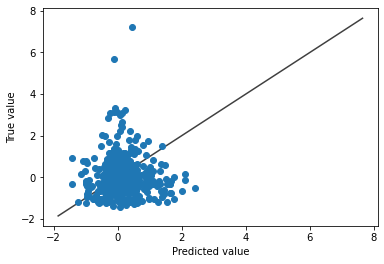

In [ ]:
from sklearn.model_selection import cross_val_predict
y_pred = cross_val_predict(estimator=LinearRegression(),X=X_TR,y=Y_TR,cv=5)
fig, ax = plt.subplots()
ax.scatter(y=Y_TR,x=y_pred)
ax.set_xlabel('Predicted value')
ax.set_ylabel('True value')
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

In [ ]:
from xgboost import XGBRegressor
from xgboost import XGBRFRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
def hyperParameterTuning(X_train, y_train):
    param_tuning = {
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7, 10],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.5, 0.7],
        'colsample_bytree': [0.5, 0.7],
        'n_estimators' : [100, 200, 500],
    }

    xgb_model = XGBRegressor()

    gsearch = GridSearchCV(estimator = xgb_model,
                           param_grid = param_tuning,                        
                           scoring = 'neg_mean_absolute_error', #MAE
                           cv = 5,
                           n_jobs = -1,
                           verbose = 1)

    gsearch.fit(X_train,y_train)

    return gsearch.best_params_

In [ ]:
hyperParameterTuning(X_TR, Y_TR)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 350 tasks      | elapsed:   34.6s
[Parallel(n_jobs=-1)]: Done 850 tasks      | elapsed:  1.4min


[14:26:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


[Parallel(n_jobs=-1)]: Done 1440 out of 1440 | elapsed:  2.6min finished


{'colsample_bytree': 0.5,
 'learning_rate': 0.01,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 200,
 'subsample': 0.7}

[13:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:56:57] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


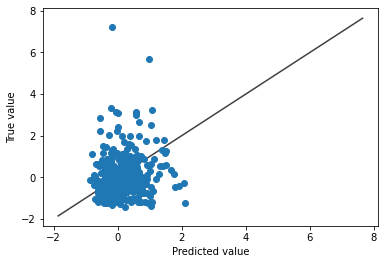

In [ ]:
#при таких параметрах точность "попадания" выше
md = XGBRegressor(
 colsample_bytree= 0.3,
 learning_rate= 0.04,
 max_depth= 3,
 min_child_weight= 5,
 n_estimators= 300,
 eval_metric='mae',
 subsample= 0.5)

#md.fit(X_train.drop(['point_id', 'counts_hotel'], axis=1), y_train, early_stopping_rounds=5, eval_set=[(X_valid.drop(['point_id', 'counts_hotel'], axis=1), y_valid)], verbose=False)
y_pred = cross_val_predict(estimator=md,X=X_TR,y=Y_TR,cv=5)
fig, ax = plt.subplots()
ax.scatter(y=Y_TR,x=y_pred)
ax.set_xlabel('Predicted value')
ax.set_ylabel('True value')
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)

In [ ]:
def cross_validation_score(estimator,X,y,scoring,n_splits=5,statement=None,random_state=0):
    if statement is None:
        cv = KFold(n_splits=n_splits,shuffle=True,random_state=random_state)
        cv_iter = list(cv.split(X, y))
    else:
        cv = StratifiedKFold(n_splits=n_splits,shuffle=True,random_state=random_state)
        cv_iter = list(cv.split(X, statement))
    scores = []
    
    for train, test in cv_iter:
        estimator.fit(X.iloc[train,:].values,y.iloc[train].values)
        if statement is not None:
            y_statement = y.iloc[test].loc[statement[test]]
            pred_statement = estimator.predict(X.iloc[test,:].loc[statement[test]].values)
        else:
            y_statement = y.iloc[test]
            pred_statement = estimator.predict(X.iloc[test,:].values)
        scores.append(scoring(y_statement,pred_statement))
    return np.array(scores)

In [ ]:
#если накинуть маску
from sklearn.model_selection import StratifiedKFold
outliers_mask = np.absolute(Y_TR-y_pred)>2.5
cross_validation_score(estimator=md,X=pd.DataFrame(X_TR),y=pd.Series(Y_TR),n_splits=5,
                                 statement=~outliers_mask,scoring=mean_absolute_error)

[12:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[12:51:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


array([0.6432369 , 0.56368965, 0.57907235, 0.61978262, 0.64739897])

<Figure size 1080x720 with 0 Axes>

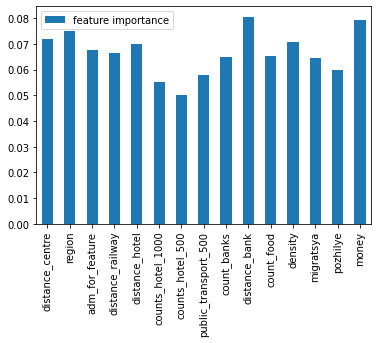

In [ ]:
#посмотрим на важность признаков
feat_importances = pd.DataFrame(md.feature_importances_, index=(X_TR).columns, columns=['feature importance'])
plt.figure(figsize=(15, 10))
feat_importances.plot(kind='bar')

In [ ]:
md.fit(X_TR, Y_TR)
pred = md.predict(X_TE)

[13:57:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
"""md.fit(Ups_TR, Up_TR)
pred = md.predict(X_TE)"""

[14:15:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


### Make submission

In [ ]:
targ = pd.DataFrame(tuts_tuts_test['point_id'])
targ['target'] = pred

targ.to_csv('g1_vyb.csv', encoding = 'utf-8', index=False)
targ

,point_id,target
0,koUetlmm,0.073336
1,hfO83LAD,-0.193083
2,kKsmoCEr,-0.147698
3,LNKVC212,-0.354514
4,ugpDLEgl,0.078169
...,...,...
102,21sDnd2f,-0.098168
103,OvdClpSy,0.032143
104,f91ZeyYl,0.051769
105,BEh6jJ04,0.628848
